In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

from zipfile import *

file_name = '/content/gdrive/My Drive/datasets/exp-data.zip'
with ZipFile(file_name, 'r') as f:
  f.extractall()
  
file_name = '/content/gdrive/My Drive/datasets/model.zip'
with ZipFile(file_name, 'r') as f:
  f.extractall()

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import math
from tqdm import tqdm
from keras.preprocessing.image import img_to_array, load_img, array_to_img

# PATH = 'dataset/exp-data'
PATH = '/content/exp-data'
IMG_SIZE = 128
CHANNELS = 3
NOISE_DIM = 100
EPOCHS = 300
EPSILON = 0.00005
BATCH_SIZE = 32 
LEARNING_RATE_DISC=0.00004
LEARNING_RATE_GEN=0.0004
BETA1 = 0.5
WEIGHT_INIT_STDDEV =0.02

# create numpy array (tensor) for the dataset
train_images = np.ndarray(shape=(6000, IMG_SIZE, IMG_SIZE, CHANNELS), dtype=np.float32)

for i, img in enumerate(os.listdir(PATH)):
    if i >= 6000:
        break
    # using keras image preprocessing package convert the images into a matrix
    image = load_img(PATH + '/' + img)
    x = img_to_array(image)
    
    # add the matrices into the tensor
    train_images[i] = x

train_images.shape

Using TensorFlow backend.


(6000, 128, 128, 3)

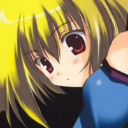

In [3]:
test = array_to_img(train_images[0])
test

In [4]:
train_images = train_images/127.5 - 1 # normalize data to -1 to 1
len(train_images[0])

128

In [0]:
def Generator(Z,training):
    with tf.variable_scope('generator',reuse=not training):
        
        # z = tf.placeholder(tf.float32, (None, noise_dim))
        fully_connected = tf.layers.dense(Z, 8*8*1024)
        fully_connected = tf.layers.batch_normalization(fully_connected)
        fully_connected = tf.nn.leaky_relu(fully_connected)
        
        fully_connected = tf.reshape(fully_connected, (-1, 8, 8, 1024))
        
        print(fully_connected.shape)
        
        
        # 8x8x1024 -> 16x16x512
        conv1 = tf.layers.conv2d_transpose(inputs=fully_connected,
                                           filters=512,
                                           kernel_size=[5,5],
                                           strides=[2,2],
                                           padding='SAME', 
                                           kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), 
                                           name='g_conv1')
        batch1 = tf.layers.batch_normalization(inputs = conv1,
                                               training=training,
                                               epsilon=EPSILON, 
                                               name='g_batch1')
        A1 = tf.nn.leaky_relu(batch1, name='g_A1')
        
        print(A1.shape)
        
        
        # 16x16x512 -> 32x32x256
        conv2 = tf.layers.conv2d_transpose(inputs=A1,
                                           filters=256,
                                           kernel_size=[5,5],
                                           strides=[2,2],
                                           padding='SAME', 
                                           kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), 
                                           name='g_conv2')
        batch2 = tf.layers.batch_normalization(inputs = conv2,
                                               training=training,
                                               epsilon=EPSILON, 
                                               name='g_batch2')
        A2 = tf.nn.leaky_relu(batch2, name='g_A2')
        
        print(A2.shape)
        
        # 32x32x256-> 64x64x128
        conv3 = tf.layers.conv2d_transpose(inputs=A2,
                                           filters=128,
                                           kernel_size=[5,5],
                                           strides=[2,2],
                                           padding='SAME', 
                                           kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), 
                                           name='g_conv3')
        batch3 = tf.layers.batch_normalization(inputs = conv3,
                                               training=training,
                                               epsilon=EPSILON, 
                                               name='g_batch3')
        A3 = tf.nn.leaky_relu(batch3, name='g_A3')
        
        print(A3.shape)
        
        # 64x64x128 -> 128x128x64
        conv4 = tf.layers.conv2d_transpose(inputs=A3,
                                           filters=64,
                                           kernel_size=[5,5],
                                           strides=[2,2],
                                           padding='SAME', 
                                           kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV), 
                                           name='g_conv4')
        batch4 = tf.layers.batch_normalization(inputs = conv4,
                                               training=training,
                                               epsilon=EPSILON, 
                                               name='g_batch4')
        A4 = tf.nn.leaky_relu(batch4, name='g_A4')
        
        print(A4.shape)
        
        # 128x128x64 -> 128x128x3
        logits = tf.layers.conv2d_transpose(inputs=A4,
                                            filters=3,
                                            kernel_size=[5,5],
                                            strides=[1,1],
                                            padding='SAME', 
                                            kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                            name='g_logits')
        out = tf.tanh(logits, name='out')
        return out

In [0]:
def Discriminator(X, reuse):
    with tf.variable_scope('discriminator', reuse=reuse): 
        
        # 128*128*3 -> 64x64x64 
        conv1 = tf.layers.conv2d(inputs=X,
                                 filters=32,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding='SAME', 
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='d_conv1')
        
        batch1 = tf.layers.batch_normalization(conv1,
                                               training=True,
                                               epsilon=EPSILON, 
                                               name='d_batch1')
        A1 = tf.nn.leaky_relu(batch1, name='d_A1')
        
        print(A1.shape)
        
        # 64x64x64-> 32x32x128 
        conv2 = tf.layers.conv2d(inputs=A1,
                                 filters=128,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding='SAME', 
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='d_conv2')
        batch2 = tf.layers.batch_normalization(conv2,
                                               training=True,
                                               epsilon=EPSILON, 
                                               name='d_batch2')
        A2 = tf.nn.leaky_relu(batch2, name='d_A2')
        
        print(A2.shape)
        
        # 32x32x128 -> 16x16x256  
        conv3 = tf.layers.conv2d(inputs=A2,
                                 filters=256,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding='SAME', 
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='d_conv3')
        batch3 = tf.layers.batch_normalization(conv3,
                                               training=True,
                                               epsilon=EPSILON, 
                                               name='d_batch3')
        A3 = tf.nn.leaky_relu(batch3, name='d_A3')
        
        print(A3.shape)
        
        # 16x16x256 -> 16x16x512
        conv4 = tf.layers.conv2d(inputs=A3,
                                 filters=512,
                                 kernel_size=[5,5],
                                 strides=[1,1],
                                 padding='SAME', 
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='d_conv4')
        batch4 = tf.layers.batch_normalization(conv4,
                                               training=True,
                                               epsilon=EPSILON, 
                                               name='d_batch4')
        A4 = tf.nn.leaky_relu(batch4, name='d_A4')
        
        print(A4.shape)
        
        # 16x16x512 -> 8x8x1024
        conv5 = tf.layers.conv2d(inputs=A4,
                                 filters=1024,
                                 kernel_size=[5,5],
                                 strides=[2,2],
                                 padding='SAME', 
                                 kernel_initializer=tf.truncated_normal_initializer(stddev=WEIGHT_INIT_STDDEV),
                                 name='d_conv5')
        batch5 = tf.layers.batch_normalization(conv5,
                                               training=True,
                                               epsilon=EPSILON, 
                                               name='d_batch5')
        A5 = tf.nn.leaky_relu(batch5, name='d_A5')
        
        print(A5.shape)

        flatten = tf.reshape(A5, (-1, 8*8*1024))
        
        print(flatten.shape)
        logits = tf.layers.dense(inputs=flatten,
                                 units=1,
                                 activation=None)
        out = tf.sigmoid(logits)
        return out, logits

In [7]:
x = tf.placeholder(tf.float32, shape=(None, 128, 128, 3))
z = tf.placeholder(tf.float32, shape=(None, NOISE_DIM))

g_sample = Generator(z, True)
d_model_real, d_logits_real = Discriminator(x, reuse=False)
d_model_fake, d_logits_fake = Discriminator(g_sample, reuse=True)

real_loss = tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real))
fake_loss = tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake))
d_loss = tf.reduce_mean(real_loss+fake_loss)

g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use keras.layers.batch_normalization instead.
(?, 8, 8, 1024)
Instructions for updating:
Use keras.layers.conv2d_transpose instead.
(?, 16, 16, 512)
(?, 32, 32, 256)
(?, 64, 64, 128)
(?, 128, 128, 64)
Instructions for updating:
Use keras.layers.conv2d instead.
(?, 64, 64, 32)
(?, 32, 32, 128)
(?, 16, 16, 256)
(?, 16, 16, 512)
(?, 8, 8, 1024)
(?, 65536)
(?, 64, 64, 32)
(?, 32, 32, 128)
(?, 16, 16, 256)
(?, 16, 16, 512)
(?, 8, 8, 1024)
(?, 65536)


In [8]:
print(g_sample.shape)
print(d_model_real, d_logits_real)
print(d_model_fake, d_logits_fake)
print(d_loss)
print(g_loss)

(?, 128, 128, 3)
Tensor("discriminator/Sigmoid:0", shape=(?, 1), dtype=float32) Tensor("discriminator/dense/BiasAdd:0", shape=(?, 1), dtype=float32)
Tensor("discriminator_1/Sigmoid:0", shape=(?, 1), dtype=float32) Tensor("discriminator_1/dense/BiasAdd:0", shape=(?, 1), dtype=float32)
Tensor("Mean:0", shape=(), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32)


In [0]:
g_vars = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES,scope='generator')
d_vars = tf.get_collection(tf.GraphKeys.GLOBAL_VARIABLES,scope='discriminator')

g_step = tf.train.AdamOptimizer(learning_rate=LEARNING_RATE_GEN, beta1=BETA1).minimize(g_loss,var_list = g_vars)
d_step = tf.train.AdamOptimizer(learning_rate=LEARNING_RATE_DISC, beta1=BETA1).minimize(d_loss,var_list = d_vars)

In [0]:
store_image_dir = 'dcgan-images'

try:
    os.makedirs(store_image_dir)
except FileExistsError:
    pass

def show_samples(epoch, sample_images, dim=(4,4), figsize=(8,8)):
    plt.figure(figsize=figsize)
    for i, img in enumerate(sample_images):
        img = ((img+1.0)*127.5).astype('int')
        image = array_to_img(img)
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(image)
        plt.axis('off')
    plt.tight_layout()
    plt.savefig('{}/epoch {}.png'.format(store_image_dir, epoch))
    plt.show()
    plt.close()

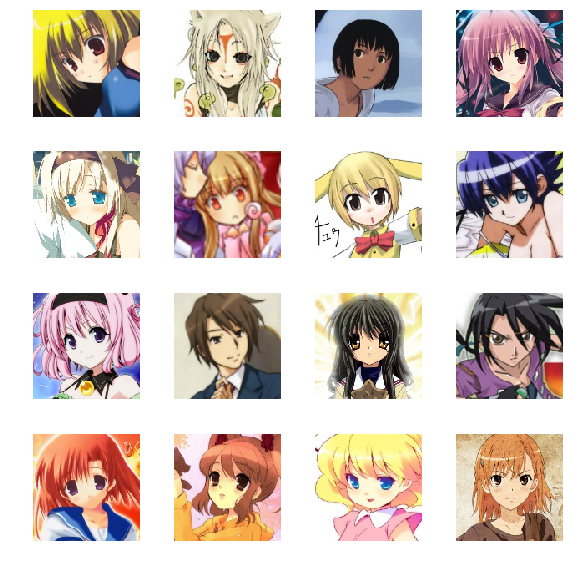

In [11]:
show_samples(0,train_images[:16])

In [0]:
# from tensorflow.python.tools.inspect_checkpoint import print_tensors_in_checkpoint_file
# saver = tf.train.Saver()

# with tf.Session() as sess:
#     sess.run(tf.global_variables_initializer())
#     print_tensors_in_checkpoint_file(file_name='model/dcgan-model-75', tensor_name='', all_tensors=True)

#     ckpt = tf.train.get_checkpoint_state(os.path.dirname('model/checkpoint'))
#     if ckpt and ckpt.model_checkpoint_path:
#         saver.restore(sess, ckpt.model_checkpoint_path)
    
#     z_batch = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_DIM))
#     g_plot = sess.run(g_sample, feed_dict={z: z_batch})
#     show_samples('test', g_plot[:16])

In [0]:
d_losses = []
g_losses = []

# with tf.Session() as sess:
#     sess.run(tf.global_variables_initializer()) 
#     z_batch = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_DIM))
#     g_plot = sess.run(g_sample, feed_dict={z: z_batch})
#     show_samples(g_plot[:16])

def train(epochs, batch_size=64, step=1):
    if step > epochs:
        print('Error: step number greater than epochs')
        return
    
    # training of (6000,128,128,3)
    m = train_images.shape[0] # number of training examples
    batch_count = m/batch_size # number of minibatches
    print ('Epochs:', epochs)
    print ('Batch size:', batch_size)
    print ('Batches per epoch:', batch_count)
    
    saver = tf.train.Saver(max_to_keep=4, keep_checkpoint_every_n_hours=2)
    
    # number of mini batches of size batch_size in your partitionning
    num_complete_minibatches = math.floor(batch_count)
    
    with tf.Session() as sess:
        # initialize variables otherwise FailedPreconditionError
        sess.run(tf.global_variables_initializer())
        
        
        # restore the checkpoint if this is continued from previous training
        ckpt = tf.train.get_checkpoint_state(os.path.dirname('model/checkpoint'))
        if ckpt and ckpt.model_checkpoint_path:
            saver.restore(sess, ckpt.model_checkpoint_path)
        
        for e in range(step, epochs+1):
            
            # minibatches without the end case
            for i in tqdm(range(0,num_complete_minibatches)):
                x_batch = train_images[i*batch_size:(i+1)*batch_size]
                z_batch = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_DIM))
#                 print(x_batch.shape)
#                 print(z_batch.shape)
                
                _, dloss = sess.run([d_step, d_loss], feed_dict={x: x_batch , z: z_batch})   
                _, gloss = sess.run([g_step, g_loss], feed_dict={z: z_batch})
                
#             print('end batch')
            # Handling the end case (last mini-batch < mini_batch_size) <32
            if m % batch_size != 0:
                x_batch = train_images[batch_size*num_complete_minibatches:]
                z_batch = np.random.uniform(-1, 1, size=(x_batch.shape[0], NOISE_DIM)) # solution to <32 minibatch problem
#                 print(x_batch.shape)
#                 print(z_batch.shape)
                
                _, dloss = sess.run([d_step, d_loss], feed_dict={x: x_batch , z: z_batch})   
                _, gloss = sess.run([g_step, g_loss], feed_dict={z: z_batch})
                
            print ("Epoch: %d\t Discriminator loss: %.4f\t Generator loss: %.4f"%(e,dloss,gloss))

            if e == step or e % 5 == 0:
                z_batch = np.random.uniform(-1, 1, size=(BATCH_SIZE, NOISE_DIM))
                g_plot = sess.run(g_sample, feed_dict={z: z_batch})
                show_samples(e, g_plot[:16])
                
            if e % 20 == 0 and e is not step:
                print('Model saved for epoch {}'.format(e))
                saver.save(sess,'model/dcgan-model',global_step=e)

            d_losses.append(dloss)
            g_losses.append(gloss)

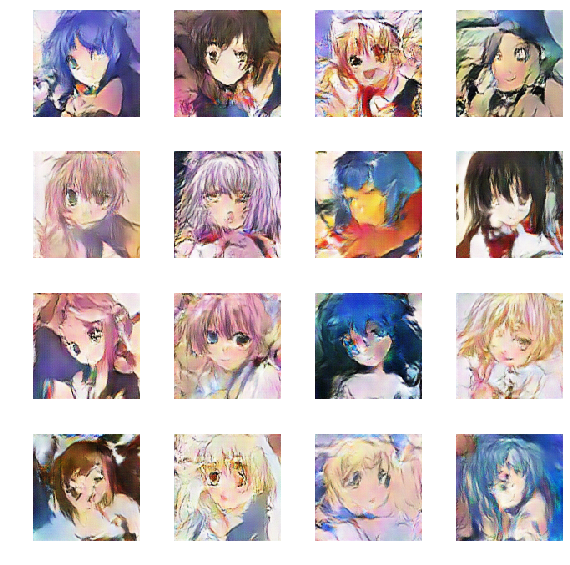

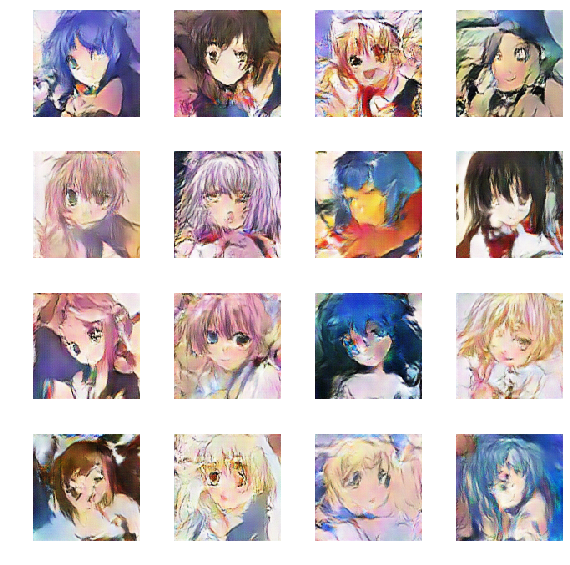

Model saved for epoch 180
Model saved for epoch 180


100%|██████████| 187/187 [02:06<00:00,  1.49it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 181	 Discriminator loss: 0.0479	 Generator loss: 5.7521
Epoch: 181	 Discriminator loss: 0.0479	 Generator loss: 5.7521


100%|██████████| 187/187 [02:05<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 182	 Discriminator loss: 0.0211	 Generator loss: 5.4849
Epoch: 182	 Discriminator loss: 0.0211	 Generator loss: 5.4849


100%|██████████| 187/187 [02:05<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 183	 Discriminator loss: 0.0238	 Generator loss: 6.5616
Epoch: 183	 Discriminator loss: 0.0238	 Generator loss: 6.5616


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 184	 Discriminator loss: 0.0212	 Generator loss: 5.9863
Epoch: 184	 Discriminator loss: 0.0212	 Generator loss: 5.9863


100%|██████████| 187/187 [02:06<00:00,  1.49it/s]



Epoch: 185	 Discriminator loss: 0.0117	 Generator loss: 6.5869
Epoch: 185	 Discriminator loss: 0.0117	 Generator loss: 6.5869


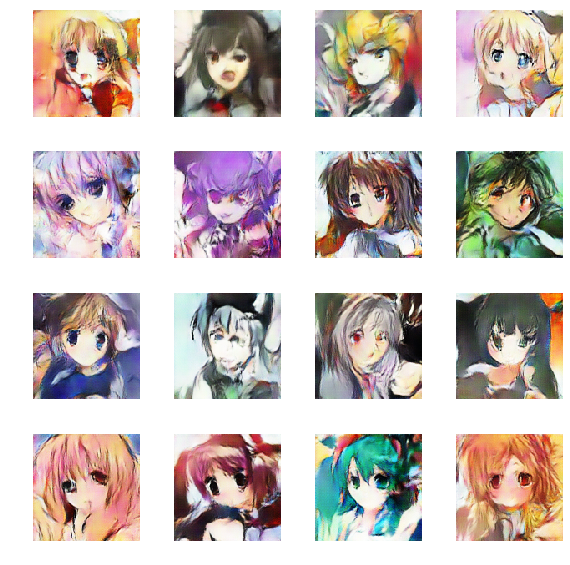

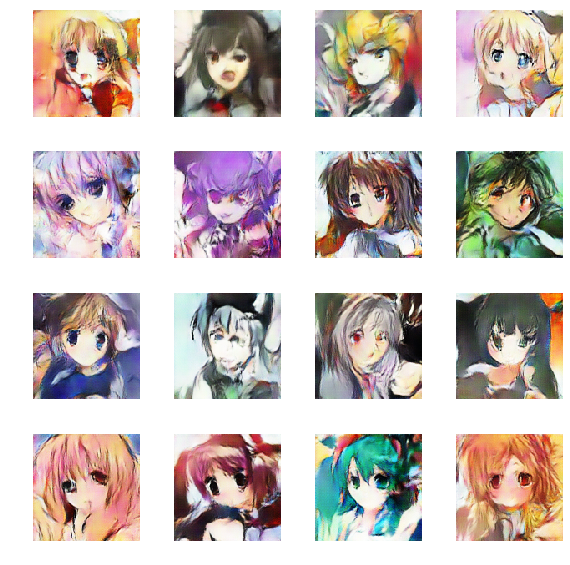

100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 186	 Discriminator loss: 0.7632	 Generator loss: 12.7743
Epoch: 186	 Discriminator loss: 0.7632	 Generator loss: 12.7743


100%|██████████| 187/187 [02:05<00:00,  1.49it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 187	 Discriminator loss: 0.1774	 Generator loss: 7.1057
Epoch: 187	 Discriminator loss: 0.1774	 Generator loss: 7.1057


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 188	 Discriminator loss: 0.0407	 Generator loss: 6.0250
Epoch: 188	 Discriminator loss: 0.0407	 Generator loss: 6.0250


100%|██████████| 187/187 [02:06<00:00,  1.49it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 189	 Discriminator loss: 0.0407	 Generator loss: 5.8969
Epoch: 189	 Discriminator loss: 0.0407	 Generator loss: 5.8969


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]



Epoch: 190	 Discriminator loss: 0.0434	 Generator loss: 5.6559
Epoch: 190	 Discriminator loss: 0.0434	 Generator loss: 5.6559


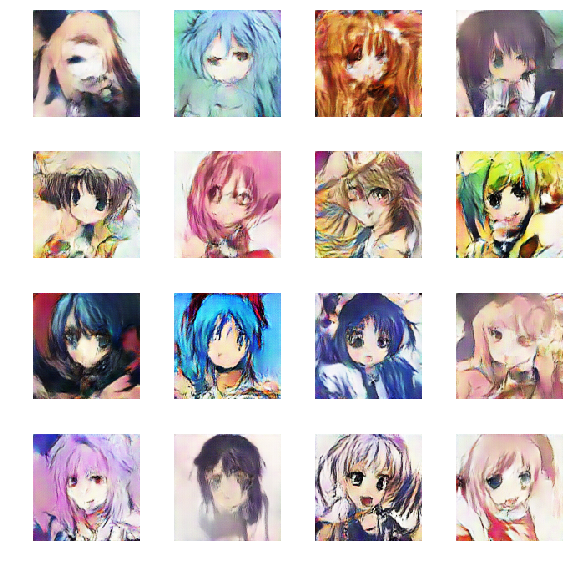

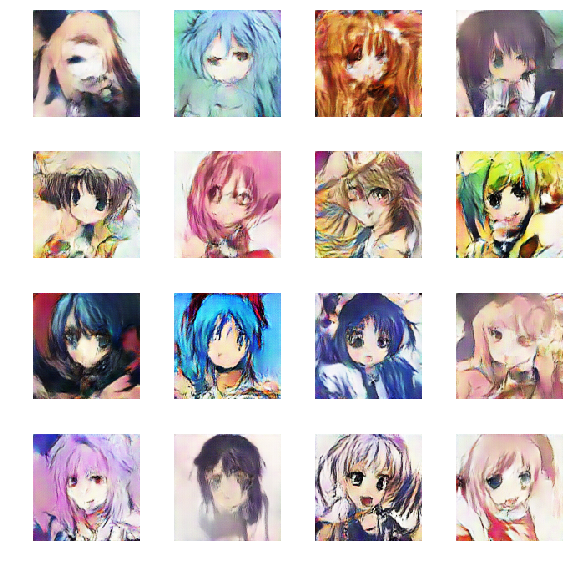

100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 191	 Discriminator loss: 0.1068	 Generator loss: 6.0604
Epoch: 191	 Discriminator loss: 0.1068	 Generator loss: 6.0604


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 192	 Discriminator loss: 0.0383	 Generator loss: 5.7525
Epoch: 192	 Discriminator loss: 0.0383	 Generator loss: 5.7525


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 193	 Discriminator loss: 0.0239	 Generator loss: 6.1154
Epoch: 193	 Discriminator loss: 0.0239	 Generator loss: 6.1154


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 194	 Discriminator loss: 0.0222	 Generator loss: 5.9666
Epoch: 194	 Discriminator loss: 0.0222	 Generator loss: 5.9666


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]



Epoch: 195	 Discriminator loss: 0.0165	 Generator loss: 6.4096
Epoch: 195	 Discriminator loss: 0.0165	 Generator loss: 6.4096


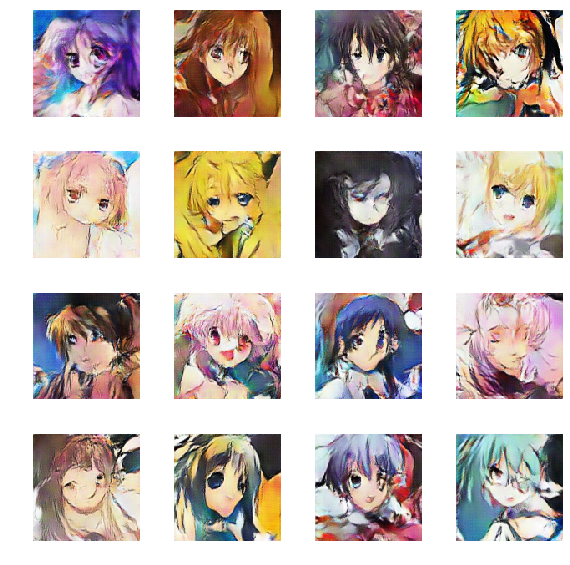

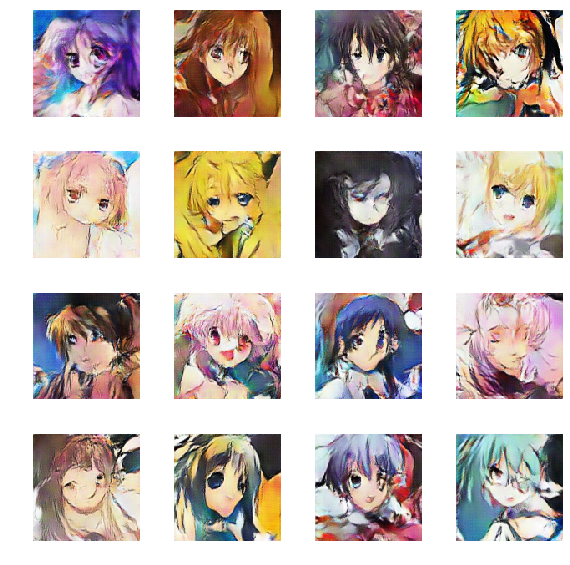

100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 196	 Discriminator loss: 0.0147	 Generator loss: 6.5651
Epoch: 196	 Discriminator loss: 0.0147	 Generator loss: 6.5651


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 197	 Discriminator loss: 0.0216	 Generator loss: 6.3808
Epoch: 197	 Discriminator loss: 0.0216	 Generator loss: 6.3808


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 198	 Discriminator loss: 0.0091	 Generator loss: 5.9406
Epoch: 198	 Discriminator loss: 0.0091	 Generator loss: 5.9406


100%|██████████| 187/187 [02:05<00:00,  1.49it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 199	 Discriminator loss: 0.0085	 Generator loss: 6.8307
Epoch: 199	 Discriminator loss: 0.0085	 Generator loss: 6.8307


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]



Epoch: 200	 Discriminator loss: 0.0200	 Generator loss: 6.7081
Epoch: 200	 Discriminator loss: 0.0200	 Generator loss: 6.7081


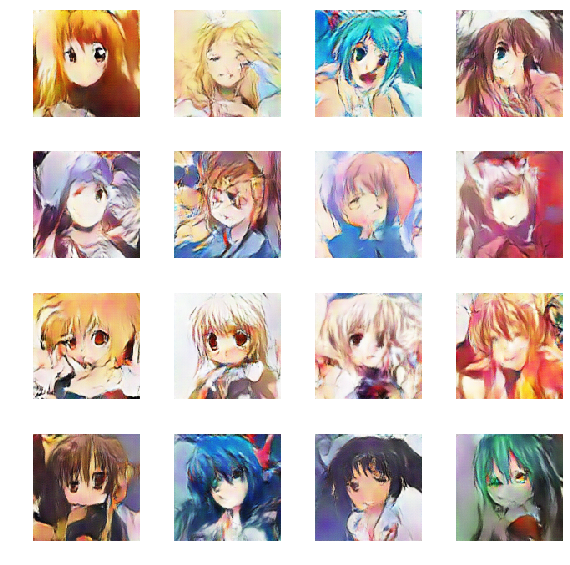

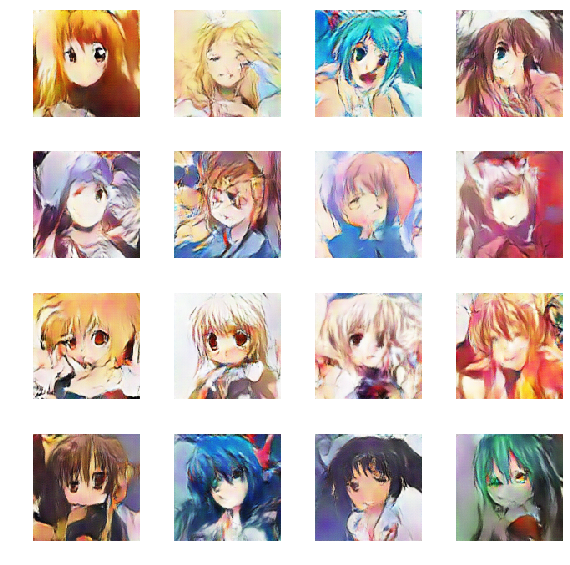

Model saved for epoch 200
Model saved for epoch 200


100%|██████████| 187/187 [02:06<00:00,  1.49it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 201	 Discriminator loss: 0.0235	 Generator loss: 7.4388
Epoch: 201	 Discriminator loss: 0.0235	 Generator loss: 7.4388


100%|██████████| 187/187 [02:06<00:00,  1.49it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 202	 Discriminator loss: 0.8248	 Generator loss: 3.7335
Epoch: 202	 Discriminator loss: 0.8248	 Generator loss: 3.7335


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 203	 Discriminator loss: 0.0531	 Generator loss: 5.3753
Epoch: 203	 Discriminator loss: 0.0531	 Generator loss: 5.3753


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 204	 Discriminator loss: 0.0282	 Generator loss: 5.5355
Epoch: 204	 Discriminator loss: 0.0282	 Generator loss: 5.5355


100%|██████████| 187/187 [02:06<00:00,  1.47it/s]



Epoch: 205	 Discriminator loss: 0.1043	 Generator loss: 8.3180
Epoch: 205	 Discriminator loss: 0.1043	 Generator loss: 8.3180


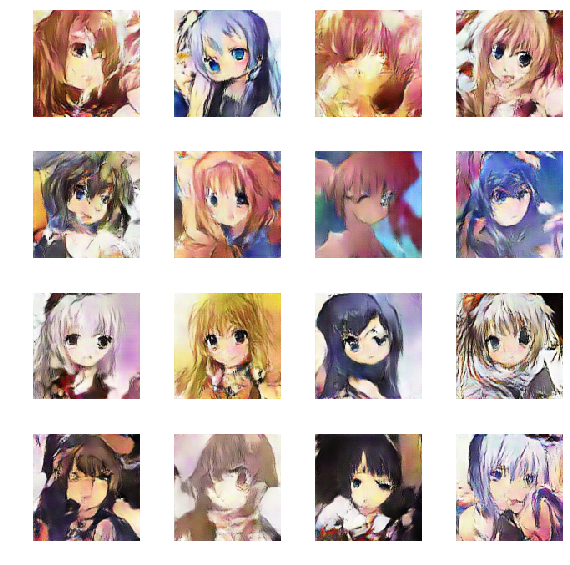

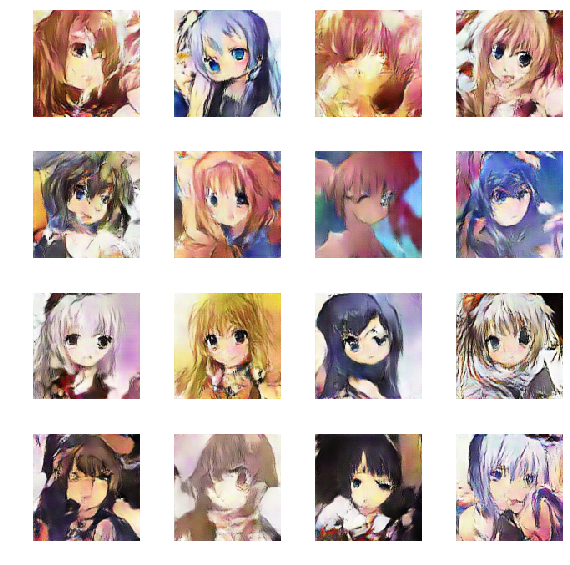

100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 206	 Discriminator loss: 0.0517	 Generator loss: 5.6275
Epoch: 206	 Discriminator loss: 0.0517	 Generator loss: 5.6275


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 207	 Discriminator loss: 0.0298	 Generator loss: 6.2805
Epoch: 207	 Discriminator loss: 0.0298	 Generator loss: 6.2805


100%|██████████| 187/187 [02:06<00:00,  1.49it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 208	 Discriminator loss: 0.0118	 Generator loss: 7.1253
Epoch: 208	 Discriminator loss: 0.0118	 Generator loss: 7.1253


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 209	 Discriminator loss: 0.0154	 Generator loss: 6.4625
Epoch: 209	 Discriminator loss: 0.0154	 Generator loss: 6.4625


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]



Epoch: 210	 Discriminator loss: 0.1467	 Generator loss: 10.9263
Epoch: 210	 Discriminator loss: 0.1467	 Generator loss: 10.9263


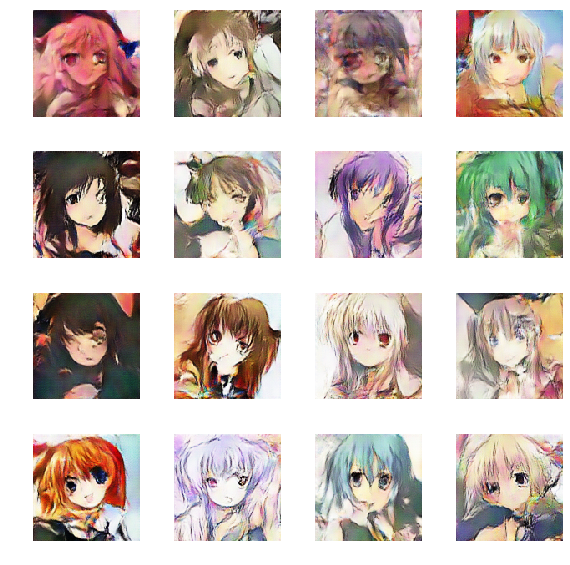

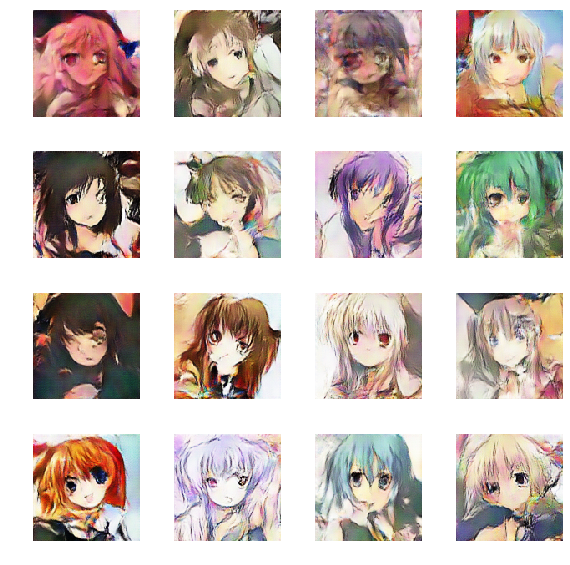

100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 211	 Discriminator loss: 0.0703	 Generator loss: 6.1325
Epoch: 211	 Discriminator loss: 0.0703	 Generator loss: 6.1325


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 212	 Discriminator loss: 0.0236	 Generator loss: 5.9655
Epoch: 212	 Discriminator loss: 0.0236	 Generator loss: 5.9655


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 213	 Discriminator loss: 0.0154	 Generator loss: 6.6320
Epoch: 213	 Discriminator loss: 0.0154	 Generator loss: 6.6320


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 214	 Discriminator loss: 0.0099	 Generator loss: 7.2283
Epoch: 214	 Discriminator loss: 0.0099	 Generator loss: 7.2283


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]



Epoch: 215	 Discriminator loss: 0.0073	 Generator loss: 8.5687
Epoch: 215	 Discriminator loss: 0.0073	 Generator loss: 8.5687


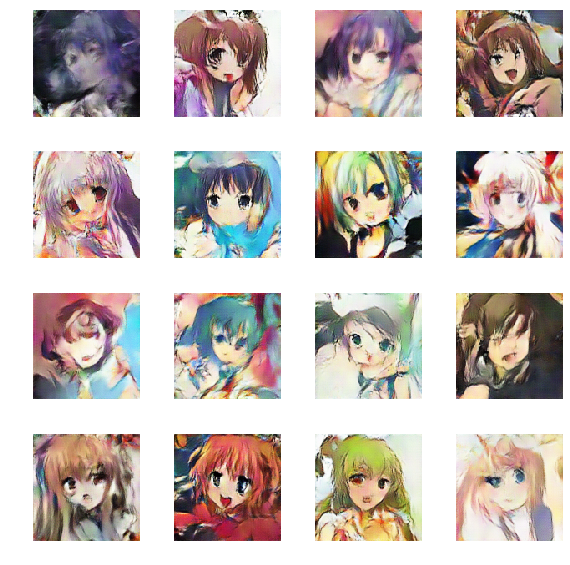

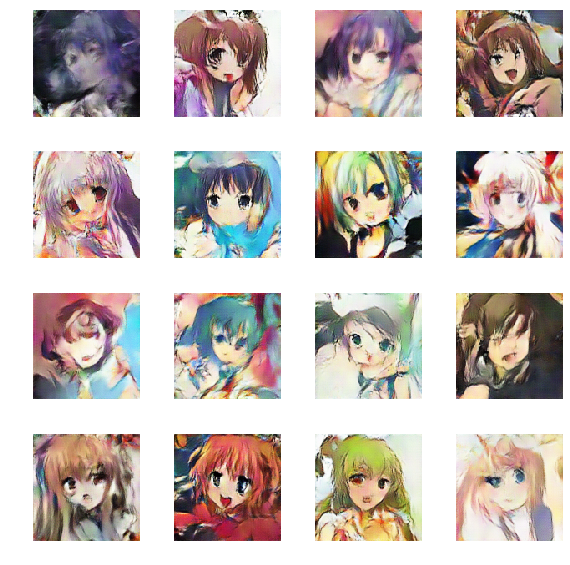

100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 216	 Discriminator loss: 0.0057	 Generator loss: 7.7843
Epoch: 216	 Discriminator loss: 0.0057	 Generator loss: 7.7843


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 217	 Discriminator loss: 0.0092	 Generator loss: 6.8701
Epoch: 217	 Discriminator loss: 0.0092	 Generator loss: 6.8701


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 218	 Discriminator loss: 0.2458	 Generator loss: 8.4737
Epoch: 218	 Discriminator loss: 0.2458	 Generator loss: 8.4737


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 219	 Discriminator loss: 0.0149	 Generator loss: 6.5294
Epoch: 219	 Discriminator loss: 0.0149	 Generator loss: 6.5294


100%|██████████| 187/187 [02:06<00:00,  1.47it/s]



Epoch: 220	 Discriminator loss: 0.0185	 Generator loss: 5.6038
Epoch: 220	 Discriminator loss: 0.0185	 Generator loss: 5.6038


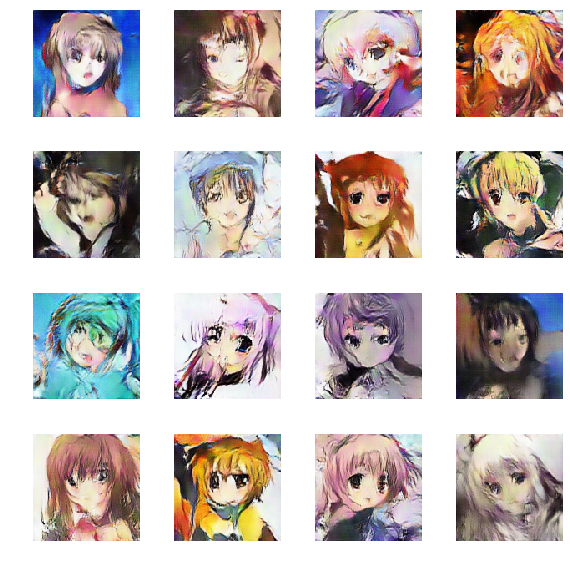

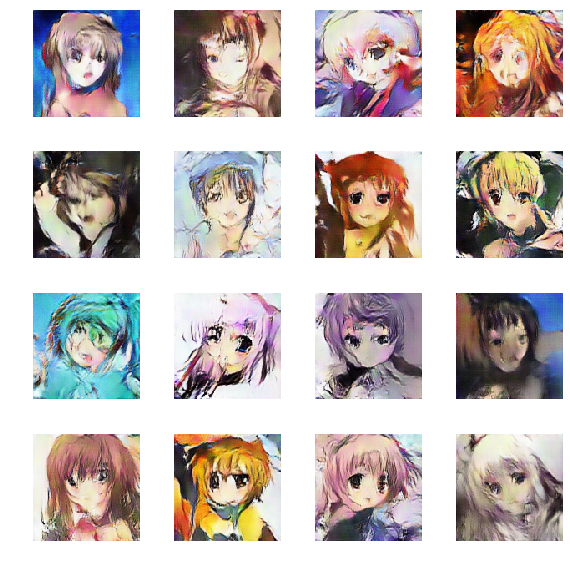

Model saved for epoch 220
Model saved for epoch 220


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 221	 Discriminator loss: 0.0195	 Generator loss: 7.0217
Epoch: 221	 Discriminator loss: 0.0195	 Generator loss: 7.0217


100%|██████████| 187/187 [02:06<00:00,  1.47it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 222	 Discriminator loss: 0.0133	 Generator loss: 6.2768
Epoch: 222	 Discriminator loss: 0.0133	 Generator loss: 6.2768


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 223	 Discriminator loss: 0.0091	 Generator loss: 6.7713
Epoch: 223	 Discriminator loss: 0.0091	 Generator loss: 6.7713


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 224	 Discriminator loss: 0.0099	 Generator loss: 6.8368
Epoch: 224	 Discriminator loss: 0.0099	 Generator loss: 6.8368


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]



Epoch: 225	 Discriminator loss: 0.0128	 Generator loss: 6.2949
Epoch: 225	 Discriminator loss: 0.0128	 Generator loss: 6.2949


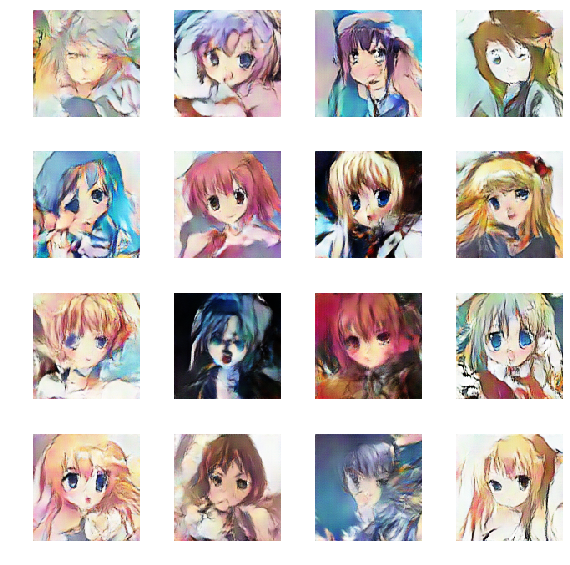

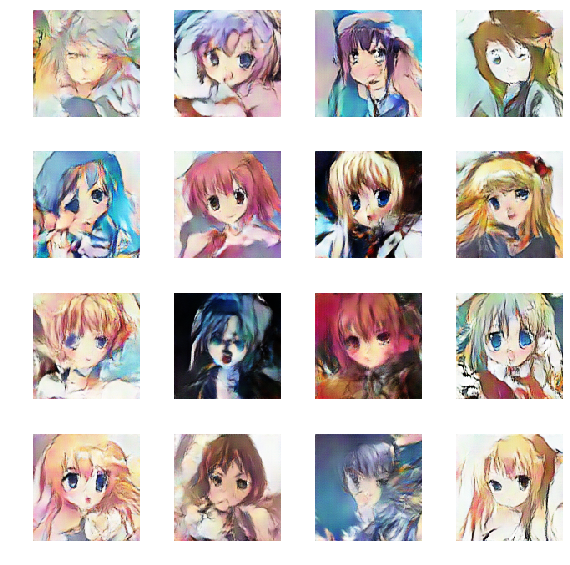

100%|██████████| 187/187 [02:06<00:00,  1.47it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 226	 Discriminator loss: 0.0067	 Generator loss: 6.8228
Epoch: 226	 Discriminator loss: 0.0067	 Generator loss: 6.8228


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 227	 Discriminator loss: 0.0036	 Generator loss: 7.7600
Epoch: 227	 Discriminator loss: 0.0036	 Generator loss: 7.7600


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 228	 Discriminator loss: 0.1010	 Generator loss: 7.5645
Epoch: 228	 Discriminator loss: 0.1010	 Generator loss: 7.5645


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 229	 Discriminator loss: 0.0341	 Generator loss: 6.3691
Epoch: 229	 Discriminator loss: 0.0341	 Generator loss: 6.3691


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]



Epoch: 230	 Discriminator loss: 0.0301	 Generator loss: 7.1465
Epoch: 230	 Discriminator loss: 0.0301	 Generator loss: 7.1465


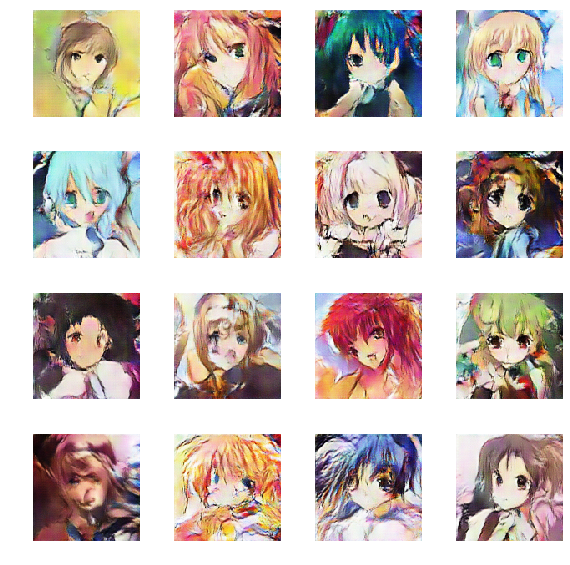

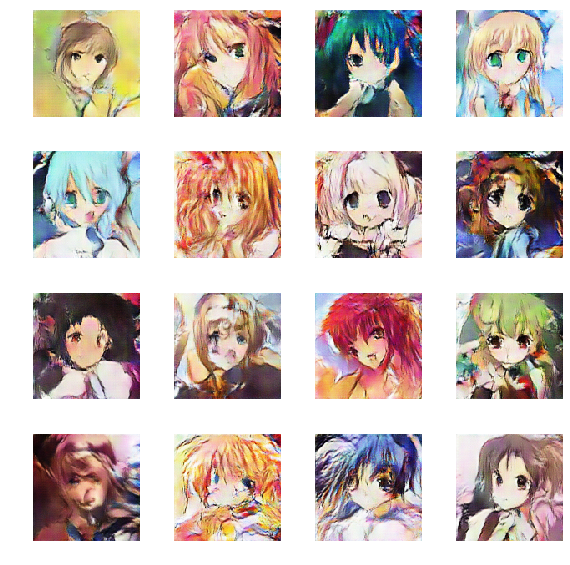

100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 231	 Discriminator loss: 0.0151	 Generator loss: 6.9460
Epoch: 231	 Discriminator loss: 0.0151	 Generator loss: 6.9460


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 232	 Discriminator loss: 0.0555	 Generator loss: 7.6280
Epoch: 232	 Discriminator loss: 0.0555	 Generator loss: 7.6280


100%|██████████| 187/187 [02:06<00:00,  1.47it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 233	 Discriminator loss: 0.0116	 Generator loss: 6.4002
Epoch: 233	 Discriminator loss: 0.0116	 Generator loss: 6.4002


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 234	 Discriminator loss: 0.0130	 Generator loss: 6.2520
Epoch: 234	 Discriminator loss: 0.0130	 Generator loss: 6.2520


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]



Epoch: 235	 Discriminator loss: 0.0197	 Generator loss: 6.8857
Epoch: 235	 Discriminator loss: 0.0197	 Generator loss: 6.8857


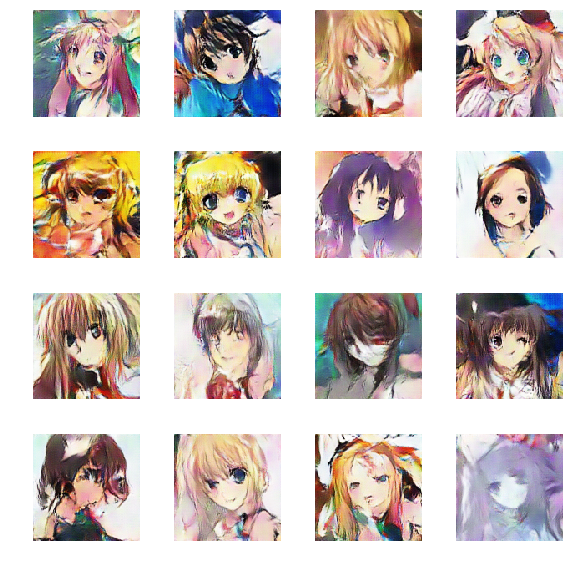

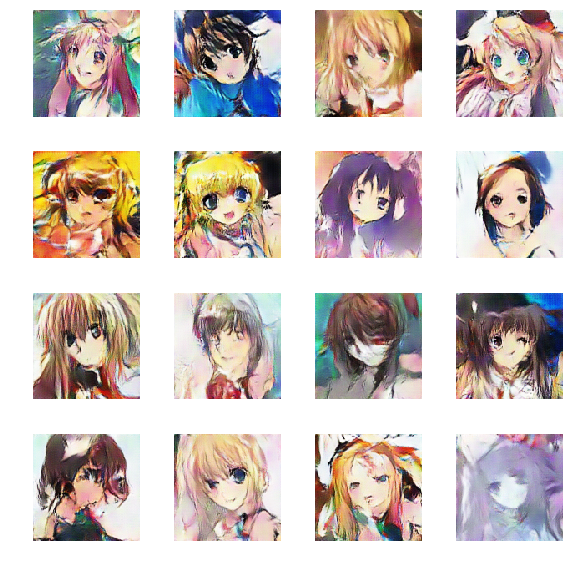

100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 236	 Discriminator loss: 0.0133	 Generator loss: 6.7539
Epoch: 236	 Discriminator loss: 0.0133	 Generator loss: 6.7539


100%|██████████| 187/187 [02:05<00:00,  1.49it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 237	 Discriminator loss: 0.0057	 Generator loss: 7.3251
Epoch: 237	 Discriminator loss: 0.0057	 Generator loss: 7.3251


100%|██████████| 187/187 [02:06<00:00,  1.49it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 238	 Discriminator loss: 0.0065	 Generator loss: 6.7028
Epoch: 238	 Discriminator loss: 0.0065	 Generator loss: 6.7028


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 239	 Discriminator loss: 0.0078	 Generator loss: 6.5179
Epoch: 239	 Discriminator loss: 0.0078	 Generator loss: 6.5179


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]



Epoch: 240	 Discriminator loss: 0.0068	 Generator loss: 7.1803
Epoch: 240	 Discriminator loss: 0.0068	 Generator loss: 7.1803


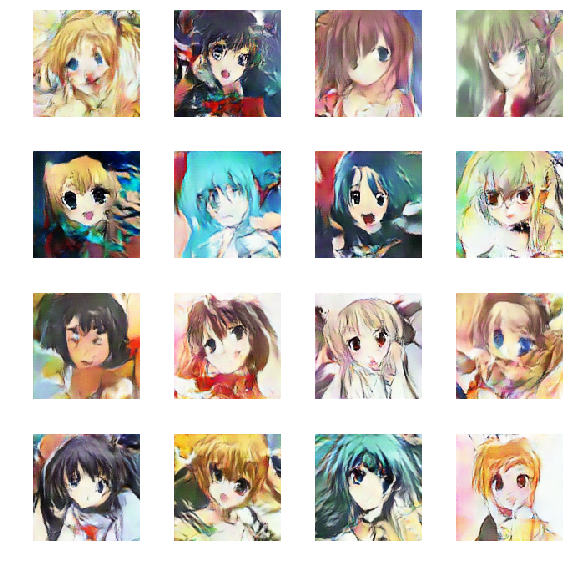

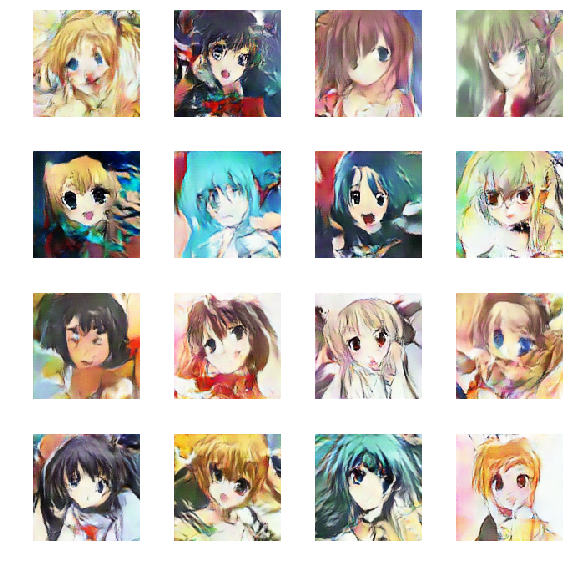

Model saved for epoch 240
Model saved for epoch 240
Instructions for updating:
Use standard file APIs to delete files with this prefix.
Instructions for updating:
Use standard file APIs to delete files with this prefix.


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 241	 Discriminator loss: 0.0129	 Generator loss: 7.2401
Epoch: 241	 Discriminator loss: 0.0129	 Generator loss: 7.2401


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 242	 Discriminator loss: 0.7861	 Generator loss: 9.6321
Epoch: 242	 Discriminator loss: 0.7861	 Generator loss: 9.6321


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 243	 Discriminator loss: 0.1904	 Generator loss: 8.4802
Epoch: 243	 Discriminator loss: 0.1904	 Generator loss: 8.4802


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 244	 Discriminator loss: 0.0555	 Generator loss: 5.5798
Epoch: 244	 Discriminator loss: 0.0555	 Generator loss: 5.5798


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]



Epoch: 245	 Discriminator loss: 0.0545	 Generator loss: 5.5843
Epoch: 245	 Discriminator loss: 0.0545	 Generator loss: 5.5843


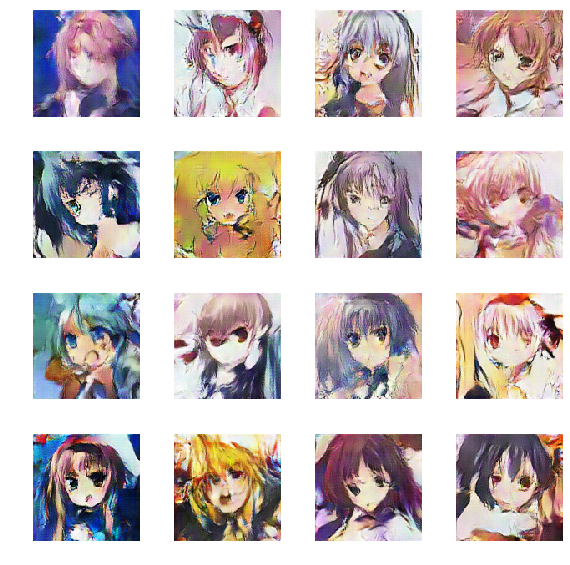

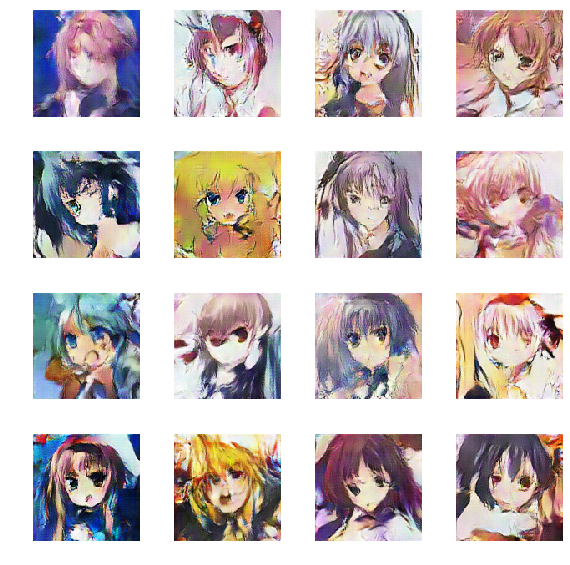

100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 246	 Discriminator loss: 0.0226	 Generator loss: 5.8014
Epoch: 246	 Discriminator loss: 0.0226	 Generator loss: 5.8014


100%|██████████| 187/187 [02:06<00:00,  1.48it/s]

  0%|          | 0/187 [00:00<?, ?it/s]

Epoch: 247	 Discriminator loss: 0.0953	 Generator loss: 6.3591
Epoch: 247	 Discriminator loss: 0.0953	 Generator loss: 6.3591


 91%|█████████▏| 171/187 [01:55<00:10,  1.48it/s]

KeyboardInterrupt: ignored

KeyboardInterrupt: ignored

In [14]:
train(EPOCHS, batch_size=BATCH_SIZE, step=140)

In [15]:
!zip -r /content/dcgan-images.zip /content/dcgan-images

  adding: content/dcgan-images/ (stored 0%)
  adding: content/dcgan-images/epoch 150.png (deflated 0%)
  adding: content/dcgan-images/epoch 235.png (deflated 0%)
  adding: content/dcgan-images/epoch 190.png (deflated 0%)
  adding: content/dcgan-images/epoch 145.png (deflated 0%)
  adding: content/dcgan-images/epoch 205.png (deflated 0%)
  adding: content/dcgan-images/epoch 0.png (deflated 0%)
  adding: content/dcgan-images/epoch 175.png (deflated 0%)
  adding: content/dcgan-images/epoch 160.png (deflated 0%)
  adding: content/dcgan-images/epoch 165.png (deflated 0%)
  adding: content/dcgan-images/epoch 240.png (deflated 0%)
  adding: content/dcgan-images/epoch 155.png (deflated 0%)
  adding: content/dcgan-images/epoch 200.png (deflated 0%)
  adding: content/dcgan-images/epoch 215.png (deflated 0%)
  adding: content/dcgan-images/epoch 230.png (deflated 0%)
  adding: content/dcgan-images/epoch 140.png (deflated 0%)
  adding: content/dcgan-images/epoch 180.png (deflated 0%)
  adding: cont

In [16]:
!zip -r /content/model.zip /content/model

  adding: content/model/ (stored 0%)
  adding: content/model/.ipynb_checkpoints/ (stored 0%)
  adding: content/model/dcgan-model-220.index (deflated 58%)
  adding: content/model/dcgan-model-200.data-00000-of-00001 (deflated 9%)
  adding: content/model/dcgan-model-130.meta (deflated 91%)
  adding: content/model/dcgan-model-220.meta (deflated 91%)
  adding: content/model/dcgan-model-130.index (deflated 58%)
  adding: content/model/dcgan-model-180.data-00000-of-00001 (deflated 9%)
  adding: content/model/dcgan-model-130.data-00000-of-00001 (deflated 9%)
  adding: content/model/dcgan-model-220.data-00000-of-00001 (deflated 9%)
  adding: content/model/dcgan-model-200.meta (deflated 91%)
  adding: content/model/dcgan-model-180.index (deflated 58%)
  adding: content/model/dcgan-model-240.meta (deflated 91%)
  adding: content/model/dcgan-model-200.index (deflated 58%)
  adding: content/model/.gitignore (stored 0%)
  adding: content/model/dcgan-model-140.meta (deflated 91%)
  adding: content/mo

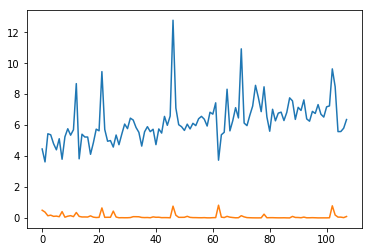

In [19]:
plt.plot(g_losses)
plt.plot(d_losses)
plt.show()